In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns; sns.set()


import plotly.express as px

In [298]:
%matplotlib inline

In [3]:
mg_number = [0,1,2,3,5,10,12,20]
storage = []
for i in mg_number:
    file_name = f'melatonin-amazon-{i}mg.xlsx'
#     print(file_name)
    df_melatonin = pd.read_excel(file_name)
    storage.append(df_melatonin)
    full_data = pd.concat(storage, ignore_index=True)
full_data.head()

,ASIN,Brand,HelpfulCounts,Images,PageUrl,ParentId,ProductLink,ProductTitle,ReviewContent,ReviewDate,ReviewScore,ReviewTitle,Reviewer,Verified
0,B07S38C5WW,Natrol,1,NaN,https://www.amazon.com/product-reviews/B07S38C...,RG75R7VDWPGQK,https://www.amazon.com/dp/B07S38C5WW,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",This melatonin supplement does a great job of ...,"November 5, 2024",5.0,"Good Melatonin Supplement – Works Fast, Slight...",Alex,True
1,B07S38C5WW,Natrol,0,NaN,https://www.amazon.com/product-reviews/B07S38C...,R39PIXPBX2VDUC,https://www.amazon.com/dp/B07S38C5WW,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",These chewable Melatonin work well.They do not...,"November 2, 2024",5.0,Works well,Tracy,True
2,B07S38C5WW,Natrol,4,NaN,https://www.amazon.com/product-reviews/B07S38C...,R3259WF0T20OXJ,https://www.amazon.com/dp/B07S38C5WW,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I have taken many different brands and kinds o...,"October 15, 2024",5.0,"Great tasting, easy to take and work quickly",Amy B,True
3,B07S38C5WW,Natrol,8,NaN,https://www.amazon.com/product-reviews/B07S38C...,R19OK9YU3RSOSE,https://www.amazon.com/dp/B07S38C5WW,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I switch up occasionally btwn other melatonin ...,"October 5, 2024",5.0,Works well,Kady,True
4,B07S38C5WW,Natrol,4,NaN,https://www.amazon.com/product-reviews/B07S38C...,R2YKVO08ND55UY,https://www.amazon.com/dp/B07S38C5WW,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Very good brand and taste good. The product se...,"July 24, 2024",4.0,Quality product and seems to help with sleep s...,Amazon Customer,True


In [5]:
# check shape
full_data.shape

(41251, 14)

In [85]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41251 entries, 0 to 41250
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ASIN           41251 non-null  object 
 1   Brand          41251 non-null  object 
 2   HelpfulCounts  41251 non-null  object 
 3   Images         8291 non-null   object 
 4   PageUrl        41251 non-null  object 
 5   ParentId       41251 non-null  object 
 6   ProductLink    41251 non-null  object 
 7   ProductTitle   41251 non-null  object 
 8   ReviewContent  40858 non-null  object 
 9   ReviewDate     41251 non-null  object 
 10  ReviewScore    41251 non-null  float64
 11  ReviewTitle    41180 non-null  object 
 12  Reviewer       41247 non-null  object 
 13  Verified       41251 non-null  bool   
dtypes: bool(1), float64(1), object(12)
memory usage: 4.1+ MB


In [87]:
full_data.isnull().sum()

ASIN                 0
Brand                0
HelpfulCounts        0
Images           32960
PageUrl              0
ParentId             0
ProductLink          0
ProductTitle         0
ReviewContent      393
ReviewDate           0
ReviewScore          0
ReviewTitle         71
Reviewer             4
Verified             0
dtype: int64

In [159]:
import re
def extract_mg(product_title):
    match = re.search(r"(\d+)\s*mg", product_title, re.IGNORECASE)
    mg_number = int(match.group(1))
    return mg_number if match else None

full_data['mg'] = full_data['ProductTitle'].apply(extract_mg)



In [161]:
full_data.drop(['ASIN','Images','ProductLink','PageUrl', 'ParentId'],axis=1, inplace=True)
full_data

,Brand,HelpfulCounts,ProductTitle,ReviewContent,ReviewDate,ReviewScore,ReviewTitle,Reviewer,Verified,mg
0,Natrol,1,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",This melatonin supplement does a great job of ...,"November 5, 2024",5.0,"Good Melatonin Supplement – Works Fast, Slight...",Alex,True,5
1,Natrol,0,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",These chewable Melatonin work well.They do not...,"November 2, 2024",5.0,Works well,Tracy,True,5
2,Natrol,4,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I have taken many different brands and kinds o...,"October 15, 2024",5.0,"Great tasting, easy to take and work quickly",Amy B,True,5
3,Natrol,8,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I switch up occasionally btwn other melatonin ...,"October 5, 2024",5.0,Works well,Kady,True,5
4,Natrol,4,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Very good brand and taste good. The product se...,"July 24, 2024",4.0,Quality product and seems to help with sleep s...,Amazon Customer,True,5
...,...,...,...,...,...,...,...,...,...,...
41246,Nature's Perfect Night,3,Nature's Perfect Night | Melatonin 20mg | 180 ...,After using these for only a few days I broke ...,"January 10, 2024",1.0,Bad Allergic Reaction!!!!!,In God I trustIn God I trust,True,20
41247,Nature's Perfect Night,2,Nature's Perfect Night | Melatonin 20mg | 180 ...,I just opened the bottle to find more than hal...,"November 1, 2023",1.0,Half of the pills are crushed when I opened th...,Anonymous memberAnonymous member,True,20
41248,Nature's Perfect Night,1,Nature's Perfect Night | Melatonin 20mg | 180 ...,Recieved damaged product.,"January 20, 2023",1.0,Damaged,Sami BoulosSami Boulos,True,20
41249,Nature's Perfect Night,2,Nature's Perfect Night | Melatonin 20mg | 180 ...,"Flavor was good, easy-to-use. Just did not wo...","August 5, 2022",1.0,Did not work for me,BinabooBinaboo,True,20


In [163]:
# review word count
len(full_data.ReviewTitle[0].split())

9

In [165]:
# for i in full_data[full_data['flavor'].isna()]['ProductTitle']:
#     print(i)

In [167]:
def extract_flavor(product_title):
    match = re.search(r'\b([A-Za-z\s]+)(?:-Flavored| Flavor| flavor)\b', product_title, re.IGNORECASE)
    if match:
        return f"{match.group(1)}"  
    else:
        match_none = re.search(r'\bBlackberry\b', product_title, re.IGNORECASE)
        if match_none:
            return f"{match_none.group(0)}" 
        
        else:
            return None



full_data['flavor'] = full_data['ProductTitle'].apply(extract_flavor)

#full_data

In [170]:
def extract_form(product_title):
    match_gummy = re.search(r'\bGumm(?:y|ies)\b', product_title, re.IGNORECASE)
    match_tablet = re.search(r'\bTablets\b', product_title, re.IGNORECASE)
    if match_gummy:
        return f"{match_gummy.group(0)}" 
    elif match_tablet:
         return f"{match_tablet.group(0)}" 
    else:
        
        return None

full_data['form'] = full_data['ProductTitle'].apply(extract_form)



In [172]:
full_data.isnull().sum()

Brand              0
HelpfulCounts      0
ProductTitle       0
ReviewContent    393
ReviewDate         0
ReviewScore        0
ReviewTitle       71
Reviewer           4
Verified           0
mg                 0
flavor             0
form               0
dtype: int64

In [174]:
full_data.flavor.unique()

array([' Strawberry', 'Mixed Berry', 'Blackberry', 'BlackBerry',
       'Natural Berry', 'Natural Mixed Berry'], dtype=object)

In [176]:
full_data['flavor'] = full_data['flavor'].replace(['Natural Berry','Mixed Berry'], 'Natural Mixed Berry')
full_data['flavor'] = full_data['flavor'].replace('BlackBerry', 'Blackberry')

In [178]:
full_data.flavor.unique()

array([' Strawberry', 'Natural Mixed Berry', 'Blackberry'], dtype=object)

### Relationship between HelpfulCounts and ReviewScore

In [183]:
extext_HelpfulCounts = full_data[full_data['HelpfulCounts'] == '1,081']['HelpfulCounts']
full_data[full_data['HelpfulCounts'] == '1,081']['HelpfulCounts'] = extext_HelpfulCounts.str.replace(',', '').astype(float)


In [185]:
mask = full_data['HelpfulCounts'] == '1,081'
full_data.loc[mask, 'HelpfulCounts'] = full_data.loc[mask, 'HelpfulCounts'].str.replace(',', '').astype(float)


In [187]:


full_data[['HelpfulCounts', 'ReviewScore']].corr(numeric_only = True)




,ReviewScore
ReviewScore,1.0


In [190]:
x = 'HelpfulCounts'
y = 'ReviewScore'
plt.scatter(data=full_data, x=x, y=y, alpha=.5)
plt.xlabel(x)
plt.ylabel(y)
plt.gcf().set_size_inches((12, 5))

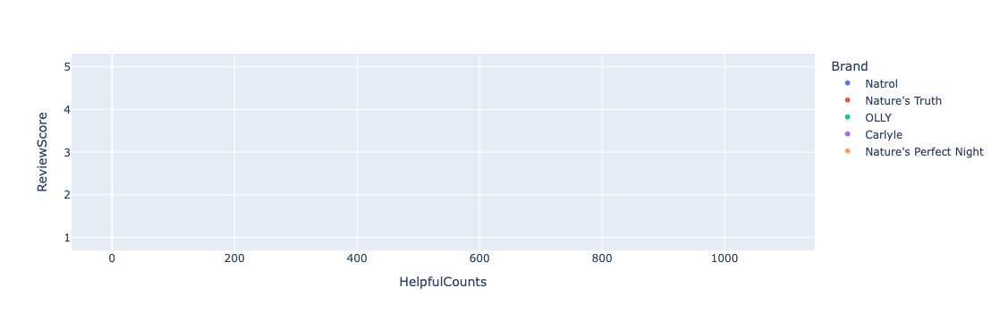

In [192]:
fig = px.scatter(full_data, x=('HelpfulCounts'), y=('ReviewScore'), color=('Brand'),hover_data={
        'mg': True,        
        'form': True,      
        'HelpfulCounts': True,
        'ReviewScore': True,
        'Brand': True},
        labels={
        'HelpfulCounts': "HelpfulCounts",
        'ReviewScore': "ReviewScore",
        'Brand': "Brand",
        'mg' : "mg",
        'form' : "form"
        })
fig

In [193]:
full_data[full_data['Verified']== False]

,Brand,HelpfulCounts,ProductTitle,ReviewContent,ReviewDate,ReviewScore,ReviewTitle,Reviewer,Verified,mg,flavor,form
152,Natrol,1,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",NaN,"May 8, 2024",5.0,It ıs a clean product,NBENBE,False,5,Strawberry,Tablets
164,Natrol,1,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Works as they should.Marketing changed the pac...,"August 4, 2020",5.0,New bottle is larger than the old one and has ...,NOYFBNOYFB,False,5,Strawberry,Tablets
165,Natrol,0,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Bought this a few months ago and for some reas...,"December 4, 2020",3.0,"Worked at first, not anymore/ Why does it look...",R GR G,False,5,Strawberry,Tablets
166,Natrol,5,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Dog owners please read:Our sweet Nellie is bei...,"August 9, 2019",1.0,Toxic to dogs!!!! Dog Owners Beware!,Kristy RobbinsKristy Robbins,False,5,Strawberry,Tablets
167,Natrol,1,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Have you ever licked spicy strawberry flavored...,"March 2, 2021",1.0,Great Melatonin of Fire,CanfieldCanfield,False,5,Strawberry,Tablets
...,...,...,...,...,...,...,...,...,...,...,...,...
39720,Nature's Perfect Night,1,Nature's Perfect Night | Melatonin 20mg | 180 ...,I’ve been using melatonin 20 nightly for about...,"September 10, 2021",5.0,Works well,DebbDebb,False,20,Natural Mixed Berry,Tablets
39721,Nature's Perfect Night,4,Nature's Perfect Night | Melatonin 20mg | 180 ...,"Ahh, 2020 (annnnd 2021). Not great years for s...","August 30, 2021",5.0,Good value on a high dose melatonin tab,Inked PhoenixInked Phoenix,False,20,Natural Mixed Berry,Tablets
39727,Nature's Perfect Night,0,Nature's Perfect Night | Melatonin 20mg | 180 ...,Rating this 3 stars because it was not readily...,"September 19, 2024",3.0,Read Vitamins!,Jacob,False,20,Natural Mixed Berry,Tablets
39746,Nature's Perfect Night,0,Nature's Perfect Night | Melatonin 20mg | 180 ...,Sucralose is one of the top artificial sweeten...,"March 24, 2024",1.0,Contain sucralose,CutePug,False,20,Natural Mixed Berry,Tablets


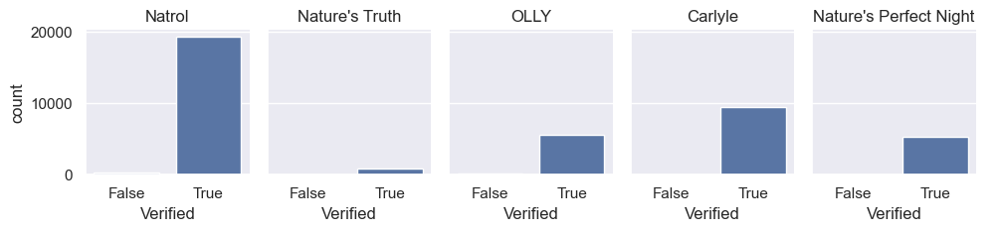

In [165]:
plot = sns.catplot(
    x="Verified",
    col="Brand",
    col_wrap=5,
    data=full_data[full_data.Brand.notnull()],
    kind="count",
    height=2.5,
    aspect=0.8
)
plot.set_titles("{col_name}")


plt.show()

In [157]:
print(full_data.groupby(['Brand', 'Verified']).size())


Brand                   Verified
Carlyle                 False          29
                        True         9525
Natrol                  False         325
                        True        19315
Nature's Perfect Night  False          74
                        True         5262
Nature's Truth          True          936
OLLY                    False         131
                        True         5654
dtype: int64


# NLP
## data cleaning

In [5]:
raw_review = full_data['ReviewContent'].dropna()
raw_review.shape

(40858,)

In [7]:
raw_df = pd.DataFrame(raw_review)
raw_df

,ReviewContent
0,This melatonin supplement does a great job of ...
1,These chewable Melatonin work well.They do not...
2,I have taken many different brands and kinds o...
3,I switch up occasionally btwn other melatonin ...
4,Very good brand and taste good. The product se...
...,...
41246,After using these for only a few days I broke ...
41247,I just opened the bottle to find more than hal...
41248,Recieved damaged product.
41249,"Flavor was good, easy-to-use. Just did not wo..."


In [9]:
raw_df.ReviewContent[7]

'Very helpful to sleep, nice flavor.'

In [11]:
import re

def clean_text(text):
    text = re.sub(r'@[A-Z_a-z_0-9_]+', '', text)
    text = re.sub(r'https?:\/\/\S+', '', text)
    text = re.sub(r'#', '', text)     # 刪除所有 # 符號。
    text = re.sub(r'\d+', '', text)  # ensure all digits are removed
    text = text.lower() # 小寫
    return text

In [13]:
copy_raw_review = raw_df.copy()

In [15]:
copy_raw_review['ReviewContent'] = copy_raw_review['ReviewContent'].apply(clean_text)

copy_raw_review

,ReviewContent
0,this melatonin supplement does a great job of ...
1,these chewable melatonin work well.they do not...
2,i have taken many different brands and kinds o...
3,i switch up occasionally btwn other melatonin ...
4,very good brand and taste good. the product se...
...,...
41246,after using these for only a few days i broke ...
41247,i just opened the bottle to find more than hal...
41248,recieved damaged product.
41249,"flavor was good, easy-to-use. just did not wo..."


In [17]:

def allclean(text):
    text = re.sub('[^A-Za-z0-9]', ' ', text)
    return(text)

copy_raw_review['ReviewContent'] = copy_raw_review['ReviewContent'].apply(allclean)

copy_raw_review

,ReviewContent
0,this melatonin supplement does a great job of ...
1,these chewable melatonin work well they do not...
2,i have taken many different brands and kinds o...
3,i switch up occasionally btwn other melatonin ...
4,very good brand and taste good the product se...
...,...
41246,after using these for only a few days i broke ...
41247,i just opened the bottle to find more than hal...
41248,recieved damaged product
41249,flavor was good easy to use just did not wo...


In [19]:
# remove stop word
stop = pd.read_csv('stop.txt', encoding = "ISO-8859-1")
stop.head()

,x
0,0001f923
1,a
2,a's
3,able
4,about


In [21]:
stop = [x.strip() for x in stop.x]
stop = [x for x in stop if x] 
stop[0:10]

['0001f923',
 'a',
 "a's",
 'able',
 'about',
 'above',
 'according',
 'accordingly',
 'across',
 'actually']

In [86]:
copy_raw_review['ReviewContent'] = copy_raw_review['ReviewContent'].apply(lambda string: " ".join(x for x in string.split() if x not in stop))

copy_raw_review


,ReviewContent,subjectivity,polarity
0,melatonin supplement great job helping fall as...,0.516667,0.280000
1,chewable melatonin work taste bad effective fa...,0.523810,0.152381
2,brands kinds melatonin product year works wond...,0.000000,0.000000
3,switch occasionally btwn melatonin brands otc ...,0.156250,0.100000
4,good brand taste good product work,0.600000,0.700000
...,...,...,...
41246,days broke hives refund,0.000000,0.000000
41247,opened bottle find half pills crushed unusable...,0.133333,-0.133333
41248,recieved damaged product,0.000000,0.000000
41249,flavor good easy work mg brand brand mg works,0.716667,0.566667


In [29]:
# check frequency of each word
freq_content = pd.Series(' '.join(copy_raw_review['ReviewContent']).split()).value_counts()
freq_content.shape

(7243,)

In [33]:
freq_content[:20].sort_values(ascending=False)


sleep        19680
melatonin    11958
mg           10274
taste         9339
product       9310
asleep        8496
work          8394
night         8086
good          7172
ve            6398
works         6298
don           5975
bottle        5953
great         5702
taking        5499
time          4922
fall          4599
flavor        4429
brand         4330
pills         4099
Name: count, dtype: int64

## Tokenization, Counting and Normalizing the tokens

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

cvect = CountVectorizer(min_df = 1, max_df = 0.9)
X = cvect.fit_transform(copy_raw_review["ReviewContent"])
X.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [37]:
## create word count data frame
word_freq_df = pd.DataFrame({'term': cvect.get_feature_names_out(), 
                             'occurrences':np.asarray(X.sum(axis=0)).ravel().tolist()})

word_freq_df

,term,occurrences
0,aaron,36
1,aave,4
2,aback,1
3,abdominal,26
4,ability,57
...,...,...
7238,zzzquil,47
7239,zzzz,4
7240,zzzzzz,9
7241,zzzzzzz,12


In [39]:
word_freq_df['frequency'] = word_freq_df['occurrences']/np.sum(word_freq_df['occurrences'])

In [41]:
word_freq_df

,term,occurrences,frequency
0,aaron,36,0.000056
1,aave,4,0.000006
2,aback,1,0.000002
3,abdominal,26,0.000041
4,ability,57,0.000089
...,...,...,...
7238,zzzquil,47,0.000073
7239,zzzz,4,0.000006
7240,zzzzzz,9,0.000014
7241,zzzzzzz,12,0.000019


In [45]:
word_freq_df.sort_values('occurrences', ascending = False)[:20]

,term,occurrences,frequency
5815,sleep,19680,0.030667
3917,melatonin,11958,0.018634
3974,mg,10274,0.016010
6366,taste,9339,0.014553
4911,product,9310,0.014508
373,asleep,8496,0.013239
7119,work,8394,0.013080
4229,night,8086,0.012600
2762,good,7172,0.011176
6865,ve,6398,0.009970


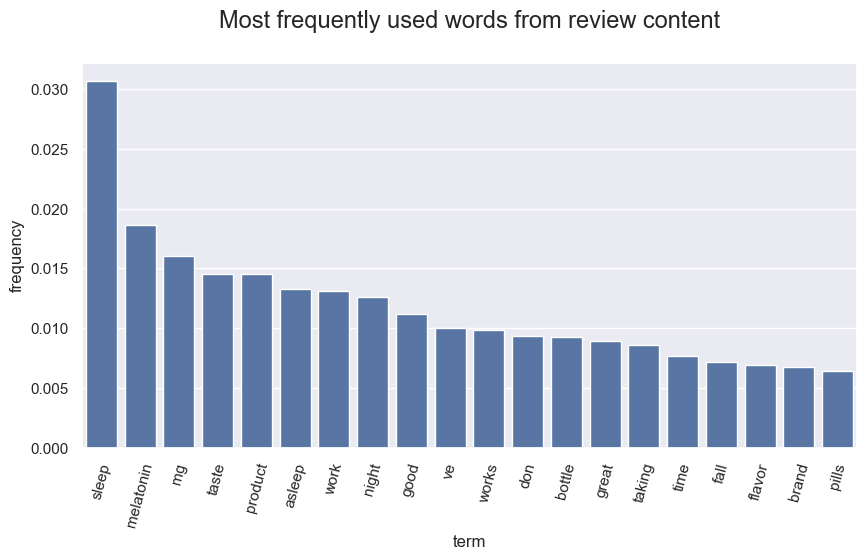

In [47]:
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x="term",y="frequency", data= word_freq_df.sort_values('frequency', ascending = False)[0:20])
plot.set_xticklabels(rotation=75, labels = word_freq_df.sort_values('frequency', ascending=False).term[0:20])
plt.title("Most frequently used words from review content", y = 1.07, fontsize = 17);
plt.show()

## N-gram

In [49]:
#Bi-gram
def top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2), 
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus) # 得到一個稀疏矩陣，行代表文檔，列代表雙字詞，值為該雙字詞在該文檔中出現的次數。
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [51]:
top2_words = top_n2_words(copy_raw_review["ReviewContent"], n=200) 
top2_df = pd.DataFrame(top2_words)
top2_df

,0,1
0,fall asleep,4091
1,stay asleep,1308
2,falling asleep,1230
3,taste good,1184
4,sleep aid,1095
...,...,...
195,tablets taste,160
196,strength sleep,160
197,asleep fast,159
198,dissolving tablets,159


In [53]:
top2_df.columns=["Bi-gram", "Freq"]
top2_df.head(20)

,Bi-gram,Freq
0,fall asleep,4091
1,stay asleep,1308
2,falling asleep,1230
3,taste good,1184
4,sleep aid,1095
5,mg melatonin,1022
6,night sleep,920
7,works great,871
8,sleep night,840
9,doesn work,808


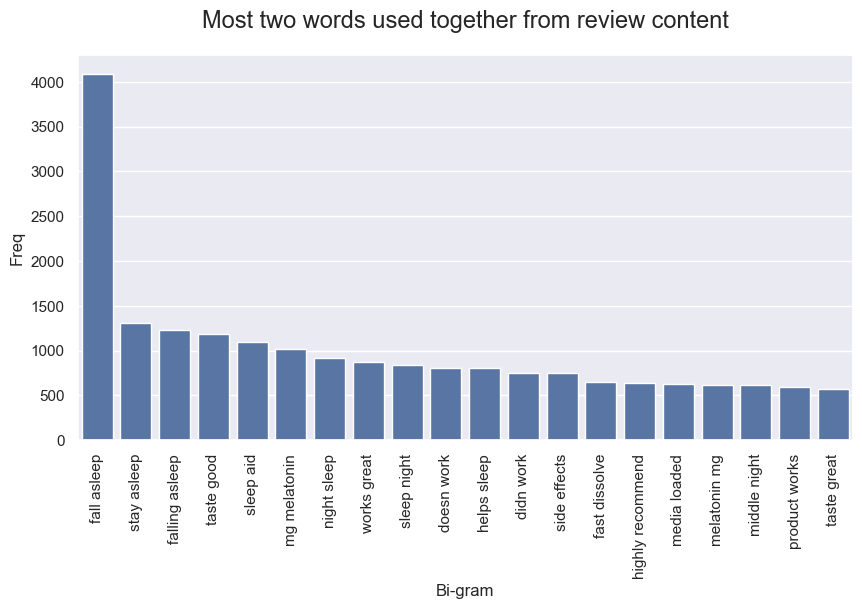

In [55]:
top20_bi_gram = top2_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_bi_gram["Bi-gram"],y=top20_bi_gram["Freq"])
plot.set_xticklabels(rotation=90,labels = top20_bi_gram["Bi-gram"])
plt.title("Most two words used together from review content", y=1.05, fontsize=17);
plt.show()

## 3-gram

In [57]:
def top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]
    

In [59]:
top3_words = top_n3_words(copy_raw_review["ReviewContent"], n=200)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]

In [61]:
top3_df

,Tri-gram,Freq
0,helps fall asleep,523
1,fall asleep faster,481
2,good night sleep,393
3,asleep stay asleep,352
4,fall asleep stay,334
...,...,...
195,melatonin gummies reading,48
196,gummies reading good,48
197,reading good reviews,48
198,good reviews work,48


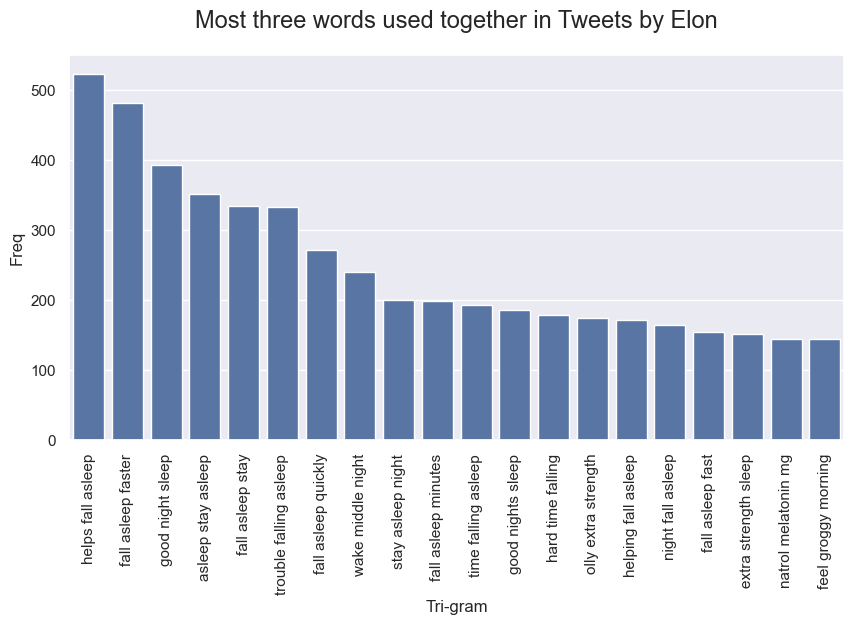

In [63]:

top20_tri_gram = top3_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_tri_gram["Tri-gram"],y=top20_tri_gram["Freq"])
plot.set_xticklabels(rotation=90,labels = top20_tri_gram["Tri-gram"])
plt.title("Most three words used together in Tweets by Elon", y=1.05, fontsize=17);
plt.show()

## World cloud

In [70]:
str_Total = " ".join(copy_raw_review["ReviewContent"])

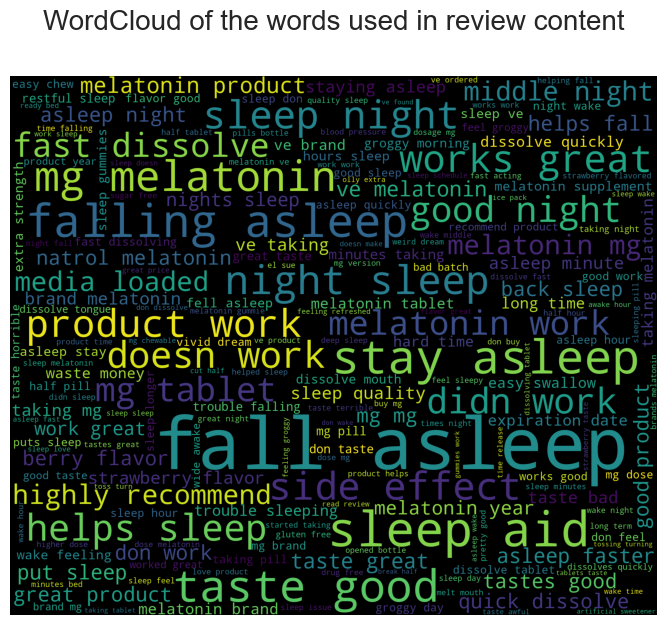

In [72]:
fig = plt.figure(figsize = (15,7))
from wordcloud import WordCloud
wordcloud_stw = WordCloud(
                background_color= 'black',
                width = 1800,
                height = 1500, random_state = 10, max_font_size = 200
                ).generate(str_Total)
plt.imshow(wordcloud_stw)
plt.title("WordCloud of the words used in review content", y=1.07, fontsize=20);
plt.axis('off')
plt.show()

## Sentimental Analysis

In [84]:
copy_raw_review

,ReviewContent,subjectivity,polarity
0,melatonin supplement great job helping fall as...,0.516667,0.280000
1,chewable melatonin work taste bad effective fa...,0.523810,0.152381
2,brands kinds melatonin product year works wond...,0.000000,0.000000
3,switch occasionally btwn melatonin brands otc ...,0.156250,0.100000
4,good brand taste good product work,0.600000,0.700000
...,...,...,...
41246,days broke hives refund,0.000000,0.000000
41247,opened bottle find half pills crushed unusable...,0.133333,-0.133333
41248,recieved damaged product,0.000000,0.000000
41249,flavor good easy work mg brand brand mg works,0.716667,0.566667


In [76]:
from textblob import TextBlob

def get_subjectivity(text):
    return TextBlob(text).sentiment.subjectivity

def get_polarity(text):
    return TextBlob(text).sentiment.polarity

In [78]:
copy_raw_review['subjectivity'] = copy_raw_review['ReviewContent'].apply(get_subjectivity)
copy_raw_review['polarity'] = copy_raw_review['ReviewContent'].apply(get_polarity)
copy_raw_review

,ReviewContent,subjectivity,polarity
0,melatonin supplement great job helping fall as...,0.516667,0.280000
1,chewable melatonin work taste bad effective fa...,0.523810,0.152381
2,brands kinds melatonin product year works wond...,0.000000,0.000000
3,switch occasionally btwn melatonin brands otc ...,0.156250,0.100000
4,good brand taste good product work,0.600000,0.700000
...,...,...,...
41246,days broke hives refund,0.000000,0.000000
41247,opened bottle find half pills crushed unusable...,0.133333,-0.133333
41248,recieved damaged product,0.000000,0.000000
41249,flavor good easy work mg brand brand mg works,0.716667,0.566667


In [379]:
def getanalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    elif score > 0:
        return 'Positive'

In [381]:
copy_raw_review['Analysis'] = copy_raw_review['polarity'].apply(getanalysis) 
copy_raw_review   

,ReviewContent,subjectivity,polarity,Analysis
0,this melatonin supplement does a great job of ...,0.436542,0.199933,Positive
1,these chewable melatonin work well they do not...,0.523810,0.152381,Positive
2,i have taken many different brands and kinds o...,0.550000,0.250000,Positive
3,i switch up occasionally btwn other melatonin ...,0.259375,0.106250,Positive
4,very good brand and taste good the product see...,0.690000,0.805000,Positive
...,...,...,...,...
41246,after using these for only a few days i broke ...,0.550000,-0.100000,Negative
41247,i just opened the bottle to find more than hal...,0.420000,-0.003333,Negative
41248,recieved damaged product,0.000000,0.000000,Neutral
41249,flavor was good easy to use just did not work ...,0.784444,0.176667,Positive


## see positive review

In [384]:
positive_review = copy_raw_review[copy_raw_review['Analysis'] == 'Positive']
positive_review = positive_review.sort_values('polarity', ascending = False)
positive_review

,ReviewContent,subjectivity,polarity,Analysis
16805,these are the best,0.30000,1.000000e+00,Positive
21088,very happy with this purchase,1.00000,1.000000e+00,Positive
27780,desicant packet was unsealed within the sealed...,1.00000,1.000000e+00,Positive
32451,desicant packet was unsealed within the sealed...,1.00000,1.000000e+00,Positive
7144,thank you my item came when it was suppose to ...,1.00000,1.000000e+00,Positive
...,...,...,...,...
34311,these work and when i wake in the mornings i f...,0.35625,6.938894e-18,Positive
29532,these work and when i wake in the mornings i f...,0.35625,6.938894e-18,Positive
28843,these work and when i wake in the mornings i f...,0.35625,6.938894e-18,Positive
26454,these work and when i wake in the mornings i f...,0.35625,6.938894e-18,Positive


## see negative review

In [387]:
negative_review = copy_raw_review[copy_raw_review['Analysis'] == 'Negative']
negative_review = negative_review.sort_values('polarity', ascending = True)
negative_review

,ReviewContent,subjectivity,polarity,Analysis
23925,horrible horrible taste,1.000000,-1.000000e+00,Negative
23570,tastes horrible,1.000000,-1.000000e+00,Negative
23582,compared to the lower dose versions these tast...,1.000000,-1.000000e+00,Negative
23584,take forever to dissolve and have a horrible t...,1.000000,-1.000000e+00,Negative
36616,they taste awful and give nightmares,1.000000,-1.000000e+00,Negative
...,...,...,...,...
14131,this isn t about the product but about the unn...,0.507051,-1.282051e-03,Negative
27039,oh man i fall asleep fast with these i recentl...,0.346032,-7.936508e-04,Negative
29427,oh man i fall asleep fast with these i recentl...,0.346032,-7.936508e-04,Negative
25394,i have no idea if these work for me or not but...,0.550000,-1.387779e-17,Negative


In [417]:
# plt.figure(figsize=(8,6))
# for i in range(0, copy_raw_review.shape[0]):
#   plt.scatter(copy_raw_review.polarity[i], copy_raw_review.subjectivity[i], color = 'green')

# plt.title("Sentiment Analysis")
# plt.xlabel('Polarity')
# plt.ylabel('Subjectivity');
# plt.show()

## Analyzing Sentiment

In [413]:
print("% of positive reviews:", round((positive_review.shape[0]/copy_raw_review.shape[0])*100, 1))
print("% of negative reivews:", round((negative_review.shape[0]/copy_raw_review.shape[0])*100, 1))

% of positive reviews: 60.2
% of negative reivews: 21.6


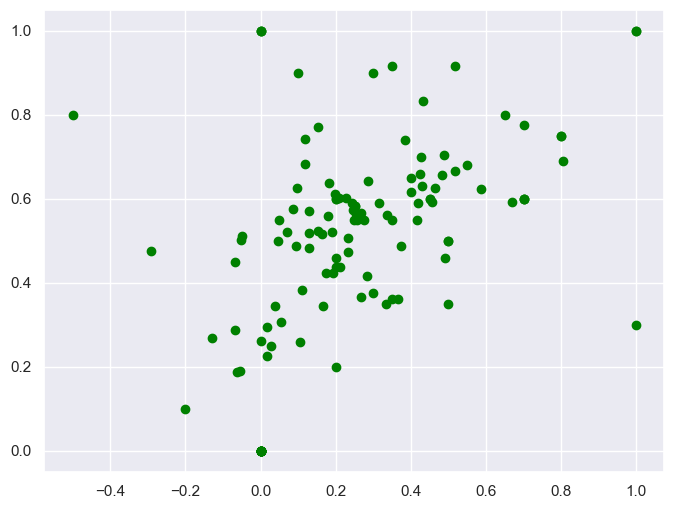

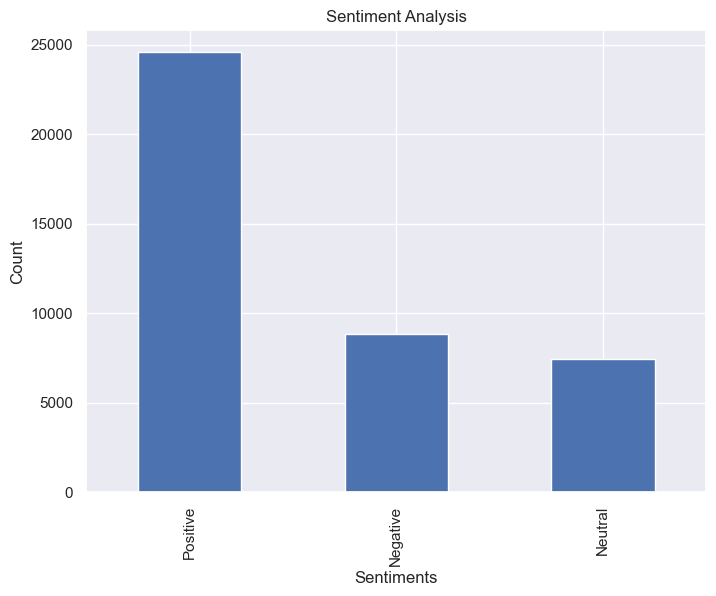

In [408]:
plt.figure(figsize=(8,6))
copy_raw_review['Analysis'].value_counts().plot(kind='bar')
plt.title("Sentiment Analysis")
plt.xlabel('Sentiments')
plt.ylabel('Count');
plt.show()

In [121]:
import spacy


nlp = spacy.load('en_core_web_sm')


In [197]:
full_data.head()

,Brand,HelpfulCounts,ProductTitle,ReviewContent,ReviewDate,ReviewScore,ReviewTitle,Reviewer,Verified,mg,flavor,form
0,Natrol,1,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",This melatonin supplement does a great job of ...,"November 5, 2024",5.0,"Good Melatonin Supplement – Works Fast, Slight...",Alex,True,5,Strawberry,Tablets
1,Natrol,0,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",These chewable Melatonin work well.They do not...,"November 2, 2024",5.0,Works well,Tracy,True,5,Strawberry,Tablets
2,Natrol,4,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I have taken many different brands and kinds o...,"October 15, 2024",5.0,"Great tasting, easy to take and work quickly",Amy B,True,5,Strawberry,Tablets
3,Natrol,8,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",I switch up occasionally btwn other melatonin ...,"October 5, 2024",5.0,Works well,Kady,True,5,Strawberry,Tablets
4,Natrol,4,"Natrol Fast Dissolve Melatonin 5 mg, Melatonin...",Very good brand and taste good. The product se...,"July 24, 2024",4.0,Quality product and seems to help with sleep s...,Amazon Customer,True,5,Strawberry,Tablets


In [199]:
copy_data_1mg = full_data[full_data['mg']==1]

In [209]:
copy_data_1mg['ReviewContent'].info()

<class 'pandas.core.series.Series'>
Index: 4492 entries, 7524 to 12015
Series name: ReviewContent
Non-Null Count  Dtype 
--------------  ----- 
4466 non-null   object
dtypes: object(1)
memory usage: 70.2+ KB


In [308]:
missing_values = copy_data_1mg['ReviewContent'].isnull().sum()
missing_values


0

In [219]:
copy_data_1mg['ReviewContent'] = copy_data_1mg['ReviewContent'].fillna('')
copy_data_1mg['ReviewContent'] = copy_data_1mg['ReviewContent'].astype(str)



In [310]:
def extract_time_entities(text):
    doc = nlp(text)
    time_entities = []
    for ent in doc.ents:
        if ent.label_ in ['TIME']:  
            time_entities.append(ent.text)
    return " ".join(time_entities)



copy_data_1mg['IntakeTime'] = copy_data_1mg['ReviewContent'].apply(extract_time_entities)
copy_data_1mg.head()

,Brand,HelpfulCounts,ProductTitle,ReviewContent,ReviewDate,ReviewScore,ReviewTitle,Reviewer,Verified,mg,flavor,form,potency,IntakeTime
7524,Natrol,169,"Natrol Fast Dissolve Melatonin 1 mg, Melatonin...","I'm 40, but have been dealing with sleep probl...","April 18, 2023",5.0,Really tasty AND effective sleep aid,Keith,True,1,Strawberry,Tablets,the morning 5pm 5pm roughly 5 hours 5-6 hours,the morning 5pm 5pm roughly 5 hours 5-6 hours
7525,Natrol,6,"Natrol Fast Dissolve Melatonin 1 mg, Melatonin...",Fast acting. Great tasting. No nightmares. I...,"September 14, 2024",5.0,The best melatonin out there,Amber,True,1,Strawberry,Tablets,a full night,a full night
7526,Natrol,2,"Natrol Fast Dissolve Melatonin 1 mg, Melatonin...","They dissolve easily, taste good, and are effe...","November 1, 2024",5.0,Really helpful on those nights that sleep just...,Brandon W,True,1,Strawberry,Tablets,,
7527,Natrol,7,"Natrol Fast Dissolve Melatonin 1 mg, Melatonin...",This is great for helping me or my kiddo fall ...,"September 4, 2024",5.0,Love the low dose,Amy Katharine,True,1,Strawberry,Tablets,.5-1,.5-1
7528,Natrol,1,"Natrol Fast Dissolve Melatonin 1 mg, Melatonin...",Dose provides assistance in obtaining quality ...,"October 12, 2024",4.0,1 mg dose is highly effective,T. Thompson,True,1,Strawberry,Tablets,,


In [312]:
# check frequency of each word
freq_content_1mg = pd.Series(' '.join(copy_data_1mg['IntakeTime']).split()).value_counts()

freq_content[:20].sort_values(ascending=False)

sleep        19680
melatonin    11958
mg           10274
taste         9339
product       9310
asleep        8496
work          8394
night         8086
good          7172
ve            6398
works         6298
don           5975
bottle        5953
great         5702
taking        5499
time          4922
fall          4599
flavor        4429
brand         4330
pills         4099
Name: count, dtype: int64

In [373]:
def top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]
top3_words = top_n3_words(copy_data_1mg['IntakeTime'], n=200)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]

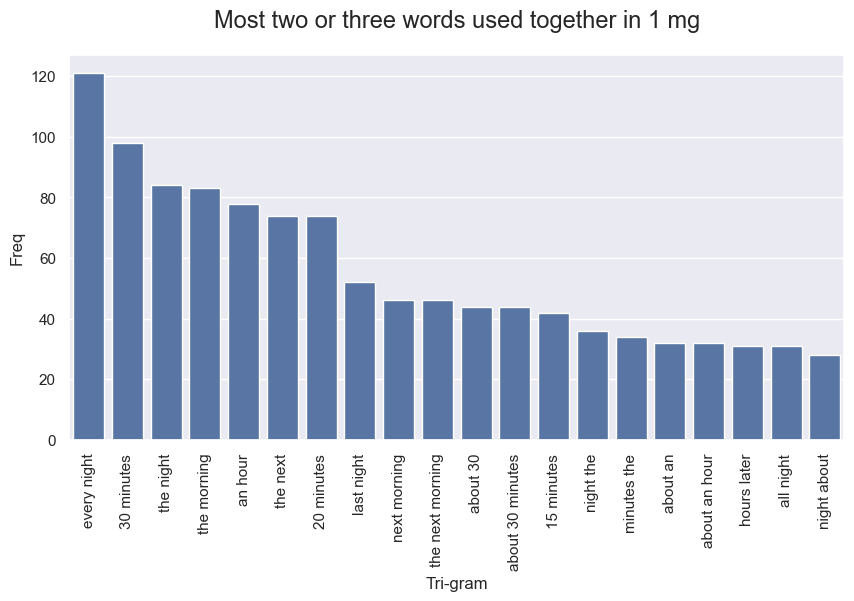

In [316]:

top20_tri_gram = top3_df.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_tri_gram["Tri-gram"],y=top20_tri_gram["Freq"])
plot.set_xticklabels(rotation=90,labels = top20_tri_gram["Tri-gram"])
plt.title("Most two or three words used together in 1 mg", y=1.05, fontsize=17);
plt.show()

## 5 mg 

In [377]:
def IntakeTime(df,mg):
    copy_data = df[df['mg']==mg]
    missing_values = copy_data_1mg['ReviewContent'].isnull().sum()
    if missing_values != 0:
        copy_data['ReviewContent'] = copy_data['ReviewContent'].fillna('')
    copy_data['ReviewContent'] = copy_data['ReviewContent'].astype(str)

    
    copy_data['IntakeTime'] = copy_data['ReviewContent'].apply(extract_time_entities)
    top3_words = top_n2_words(copy_data['IntakeTime'], n=200)
    top3_df = pd.DataFrame(top3_words)
    top3_df.columns=["Tri-gram", "Freq"]
    top20_tri_gram = top3_df.iloc[0:20,:]
    fig = plt.figure(figsize = (10, 5))
    plot=sns.barplot(x=top20_tri_gram["Tri-gram"],y=top20_tri_gram["Freq"])
    plot.set_xticklabels(rotation=90,labels = top20_tri_gram["Tri-gram"])
    plt.title(f"Most two or three words used together in {mg} mg", y=1.05, fontsize=17);
    return plt.show()

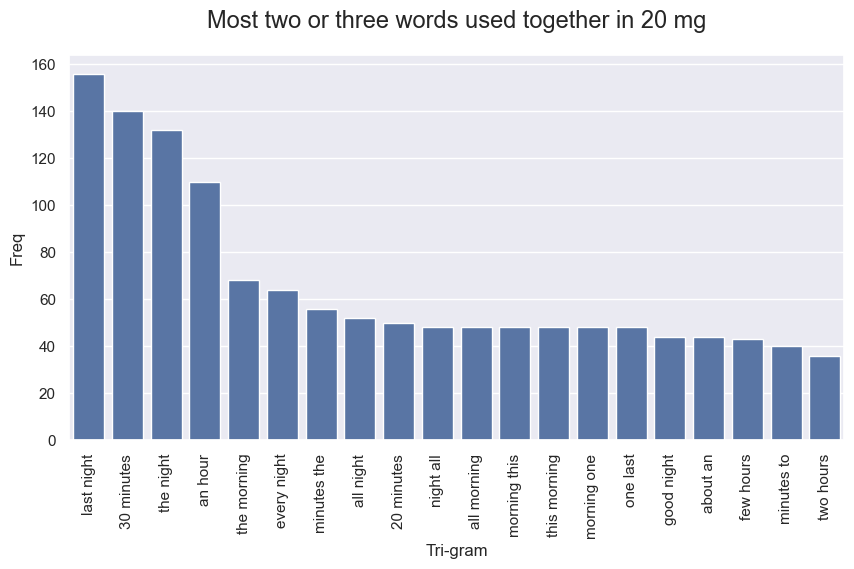

In [379]:
IntakeTime(full_data,20)

In [343]:
mg_type = full_data.mg.unique()
mg_type.sort()


array([ 1,  3,  5, 10, 12, 20])

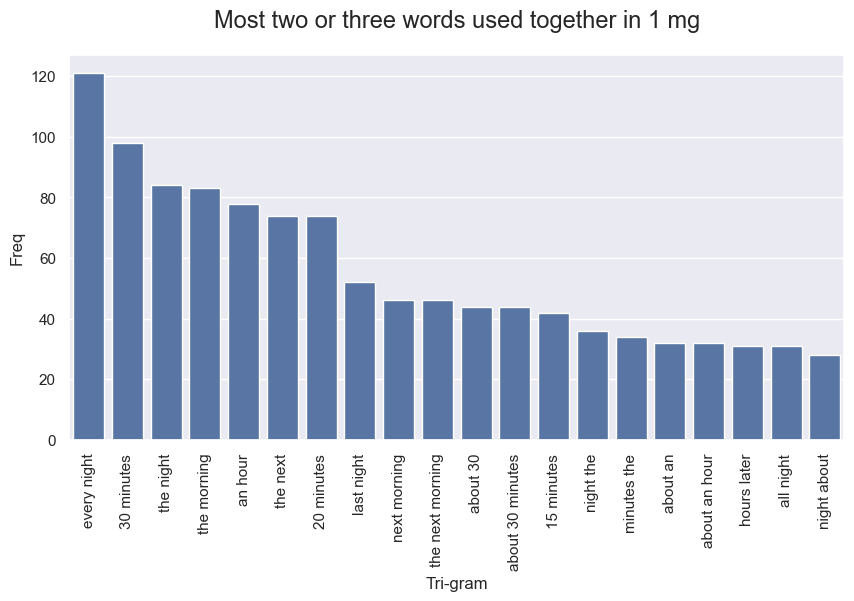

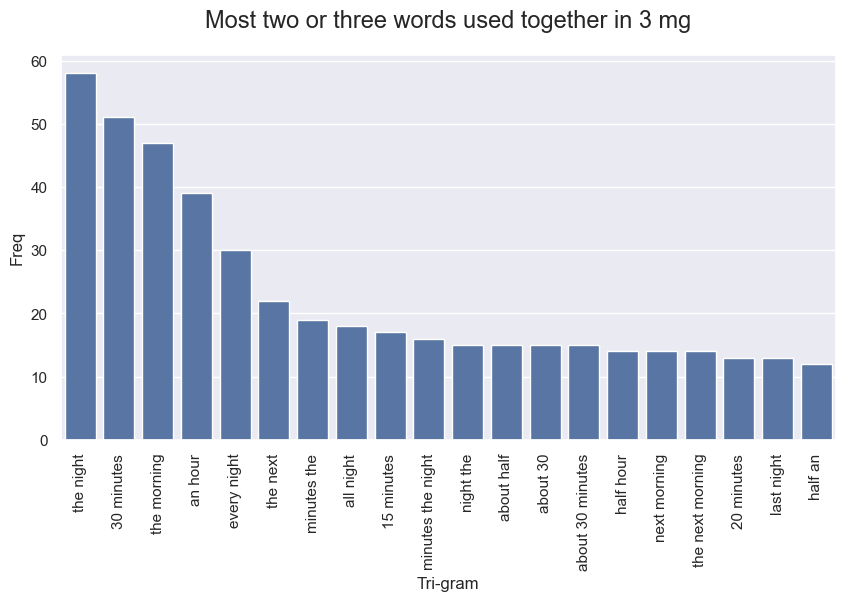

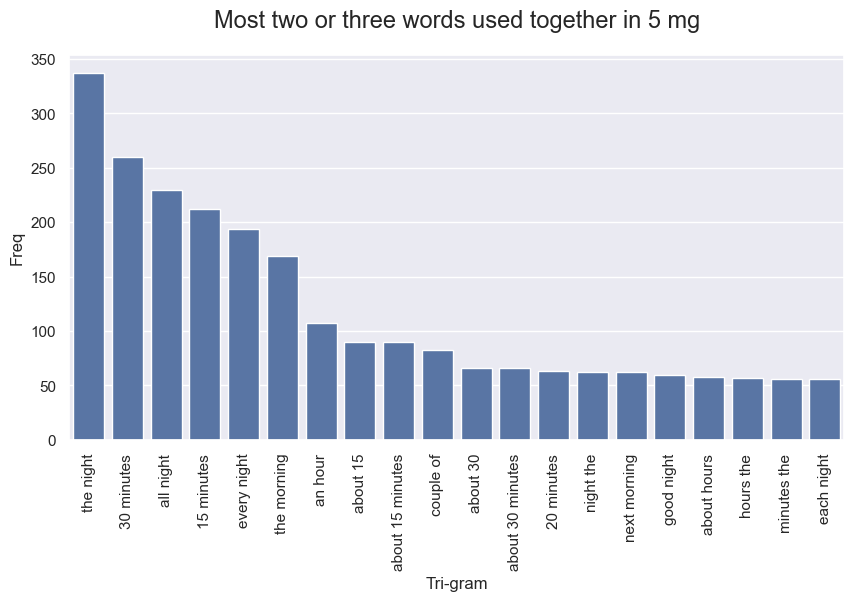

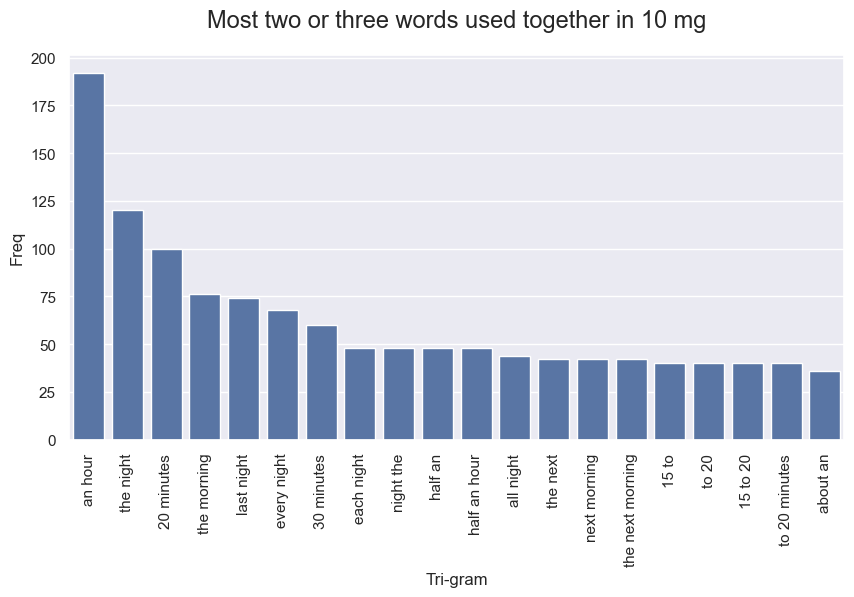

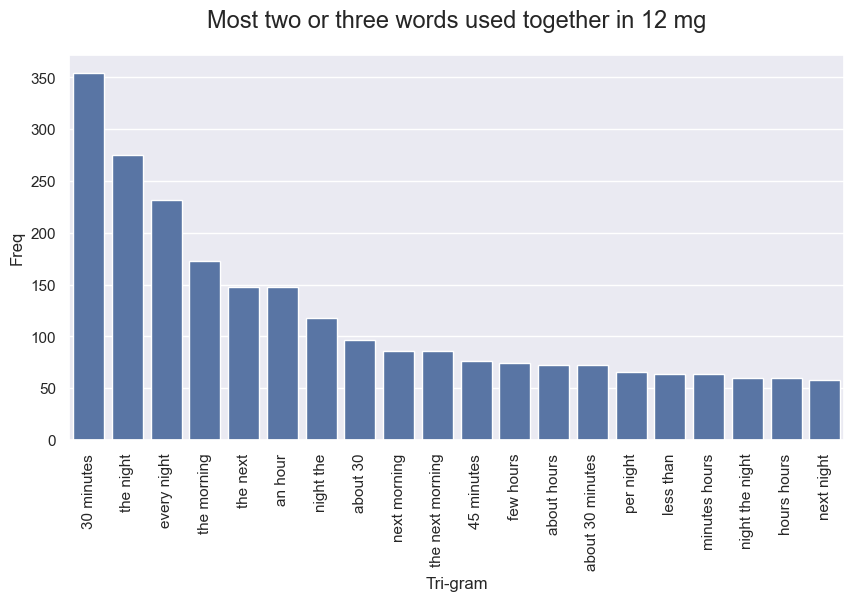

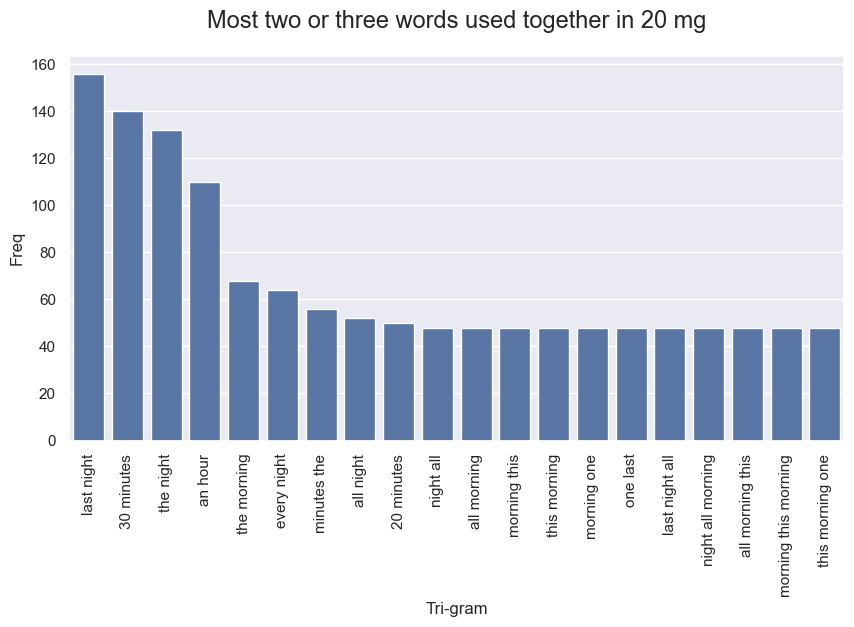

In [347]:
for i in mg_type:
    IntakeTime(full_data,i)

In [349]:
copy_20mg = full_data[full_data['mg']==20]

In [367]:
top3_words = top_n3_words(copy_20mg["ReviewContent"], n=200)
top3_df_20mg = pd.DataFrame(top3_words)
top3_df_20mg.columns=["Tri-gram", "Freq"]
top3_df_20mg

,Tri-gram,Freq
0,work for me,181
1,in your mouth,177
2,the taste is,172
3,did not work,137
4,not work for,135
...,...,...
195,option these sublingual,48
196,these sublingual tablets,48
197,sublingual tablets are,48
198,tablets are particularly,48


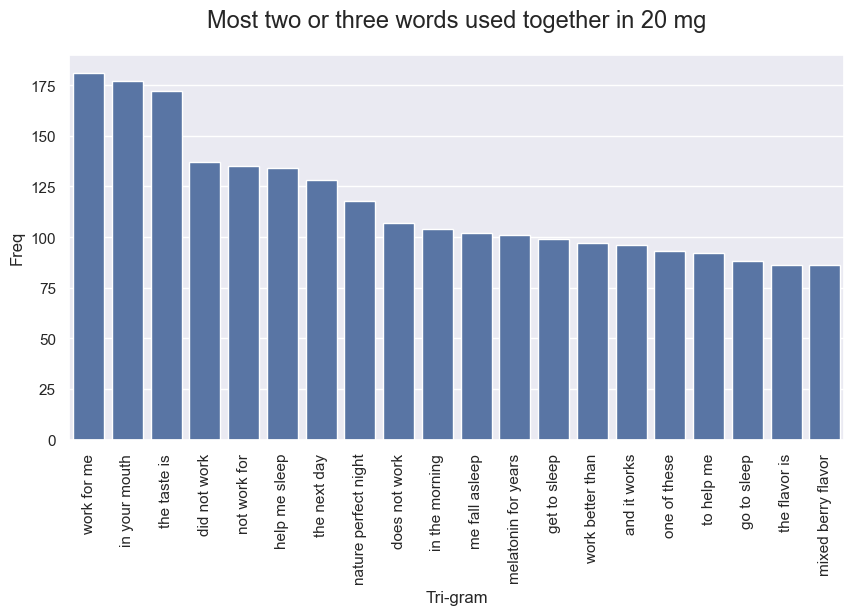

In [369]:

top20_tri_gram = top3_df_20mg.iloc[0:20,:]
fig = plt.figure(figsize = (10, 5))
plot=sns.barplot(x=top20_tri_gram["Tri-gram"],y=top20_tri_gram["Freq"])
plot.set_xticklabels(rotation=90,labels = top20_tri_gram["Tri-gram"])
plt.title(f"Most two or three words used together in 20 mg", y=1.05, fontsize=17);
plt.show()